# Imports

In [4]:
import spacy
import pandas as pd
from tqdm.auto import tqdm 
import swifter
import plotly.express as px
from wordcloud import WordCloud
from matplotlib import pyplot as plt
import textacy
from collections import Counter
import random
import os
import pickle
from matplotlib.pyplot import figure



from pathlib import Path
import ast

pd.options.plotting.backend = "plotly"
random.seed(123)

In [5]:
def cloud_from_lemmas(word_counts):
    wc = WordCloud(width=800, height=400)
    wc.generate_from_frequencies(frequencies=word_counts)
    plt.figure(figsize=(10,8))
    plt.imshow(wc)

def plot_counts(counts):
    fig = px.bar(counts,orientation='h', y='word', x='count')

    fig['layout']['yaxis']['autorange'] = "reversed"
    fig.update_layout(bargap=0.30, font={'size':10})
    return fig

In [7]:
en = spacy.load("en_core_web_sm")

In [10]:
mar02 = pd.read_csv("./02_mar.csv")
mar01 = pd.read_csv("./01_mar.csv")
feb28 = pd.read_csv("./28_feb.csv")
feb27 = pd.read_csv("./27_feb.csv")
feb26 = pd.read_csv("./26_feb.csv")
feb25 = pd.read_csv("./25_feb.csv")
feb24 = pd.read_csv("./24_feb.csv")

print(len(feb24))
feb24 = feb24.iloc[:48001]

l = [mar02, mar01, feb28, feb27, feb26, feb25, feb24]

1468659


In [11]:
for x in l:
    print(len(x))

48001
48001
48001
48001
48001
48001
48001


In [12]:
feb28

,Unnamed: 0,Datetime,Tweet Id,Text,Username,Replies Count,Retweets Count,Likes Count,Quotes Count,Language,Retweeted Tweet,Quoted Tweet,Mentioned Users
0,0,2022-02-28 23:59:59+00:00,1498447925306744832,Inside Volodymyr Velenskyy's rise to President...,ONEAMERICANMAD1,0,0,0,0,en,NaN,NaN,NaN
1,1,2022-02-28 23:59:59+00:00,1498447925080309762,"It's a summer like day, 70F. I'm sitting outsi...",TPBookSeries,1,0,1,0,en,NaN,NaN,NaN
2,2,2022-02-28 23:59:59+00:00,1498447923973079044,@wallaceme @GBNEWS It’s more deliberately pern...,Ed_Owen,0,0,4,0,en,NaN,NaN,"['wallaceme', 'GBNEWS']"
3,3,2022-02-28 23:59:59+00:00,1498447923784343563,Although the Australian Government has asked c...,CommsroomC,0,0,1,0,en,NaN,NaN,NaN
4,4,2022-02-28 23:59:59+00:00,1498447923776045060,Although @ausgov has asked citizens not to tra...,PublicSpectrum,0,1,2,0,en,NaN,NaN,['ausgov']
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47996,47996,2022-02-28 22:26:02+00:00,1498424278756200448,@barnes_law The Russians estimated military bu...,Bstokesss,1,0,11,0,en,NaN,NaN,['barnes_law']
47997,47997,2022-02-28 22:26:02+00:00,1498424278739345409,Final Rule Adds Sweeping Restrictions on Expor...,LawAnalysis,0,0,0,0,en,NaN,NaN,['mstockbridgelaw']
47998,47998,2022-02-28 22:26:01+00:00,1498424277451911168,I’d have my animals with me too. #Ukraine http...,katya_kowal,0,0,1,0,en,NaN,https://twitter.com/LorenzoTheCat/status/14983...,NaN
47999,47999,2022-02-28 22:26:01+00:00,1498424277393149958,Gadget Game News : Elon Musk’s promised Starli...,kalpak_savaliya,0,0,1,0,en,NaN,NaN,NaN


In [13]:
len(feb24)

48001

In [14]:
df = pd.concat(l)

In [15]:
df

,Unnamed: 0,Datetime,Tweet Id,Text,Username,Replies Count,Retweets Count,Likes Count,Quotes Count,Language,Retweeted Tweet,Quoted Tweet,Mentioned Users
0,0,2022-03-02 23:59:59+00:00,1499172701289828352,In solidarity with Ukraine it might be time to...,adinplore,0,0,0,0,en,NaN,NaN,NaN
1,1,2022-03-02 23:59:59+00:00,1499172700924911621,First Ukraine City Falls as Russia Strikes Mor...,JanatakhabarP,0,0,0,0,en,NaN,NaN,NaN
2,2,2022-03-02 23:59:59+00:00,1499172700157263872,There is a good @RealLifeLore22 video on this....,Liam_Holman99,0,2,2,0,en,NaN,https://twitter.com/dontbrexitfixit/status/149...,['RealLifeLore22']
3,3,2022-03-02 23:59:59+00:00,1499172699003838468,Invading Ukraine was a choice.,TELEXDesignCo,0,0,0,0,en,NaN,NaN,NaN
4,4,2022-03-02 23:59:59+00:00,1499172698978762755,@GGraczka @Ukraine That's not what they're say...,SiJeDisTakbir,1,0,0,0,en,NaN,NaN,"['GGraczka', 'Ukraine']"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47996,47996,2022-02-24 23:00:43+00:00,1496983457381105671,@niezbyt_babo @Formaela19 @lovingthemwomen @Pe...,aartemidee,0,0,1,0,en,NaN,NaN,"['niezbyt_babo', 'Formaela19', 'lovingthemwome..."
47997,47997,2022-02-24 23:00:43+00:00,1496983457377001484,"@katramdeen Holy shit Katherine, i totally for...",RonnyS0L,1,0,0,0,en,NaN,NaN,['katramdeen']
47998,47998,2022-02-24 23:00:43+00:00,1496983456877797380,@BigBluexlt Coups a comin. Certain G8s want Zs...,USAMRIID,1,3,9,1,en,NaN,NaN,['BigBluexlt']
47999,47999,2022-02-24 23:00:43+00:00,1496983456697491465,@heartshapedwomb right lmao i don't think the ...,na74362408,2,0,2,0,en,NaN,NaN,['heartshapedwomb']


## mar02

In [16]:
mar02 = mar02.iloc[:20000]

In [17]:
df = mar02

In [18]:
df = df.loc[df['Language'] == 'en']

In [19]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [20]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19981 [00:00<?, ?it/s]

In [21]:
mar02 = df

In [22]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
mar02['lemmas'] = mar02.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [23]:
mar02_word_counts = Counter(mar02.lemmas.sum())

In [24]:
mar02_counts = pd.DataFrame(Counter({k: v for k, v in mar02_word_counts.items()}).most_common(60), columns=['word', 'count'])

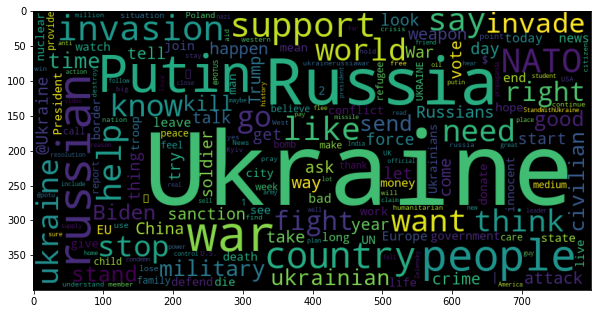

In [25]:
cloud_from_lemmas(mar02_word_counts)

In [26]:
plot_counts(mar02_counts)

In [27]:
mar02_word_counts

Counter({'solidarity': 99,
         'Ukraine': 20145,
         'time': 669,
         'remove': 92,
         'color': 34,
         'white': 127,
         'blue': 65,
         'red': 43,
         'thing': 455,
         'represent': 31,
         'russian': 2603,
         'flag': 138,
         'City': 45,
         'Falls': 20,
         'Russia': 5432,
         'strike': 95,
         'civilian': 595,
         '\xa0': 568,
         'target': 194,
         'https://t.co/It0d0ZMv9E': 1,
         'good': 602,
         '@RealLifeLore22': 1,
         'video': 225,
         'Putin': 3246,
         'want': 1124,
         'act': 160,
         'russophilic': 1,
         'buffer': 13,
         'zone': 130,
         'oil': 239,
         'field': 29,
         'strategic': 48,
         'advantage': 12,
         'https://t.co/jppja9ogmG': 1,
         'Invading': 15,
         'choice': 77,
         '@GGraczka': 1,
         '@Ukraine': 477,
         'say': 1197,
         'share': 153,
         'testimony': 

## mar01

In [28]:
mar01 = mar01.iloc[:20000]

In [29]:
df = mar01

In [30]:
df = df.loc[df['Language'] == 'en']

In [31]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [32]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19983 [00:00<?, ?it/s]

In [33]:
mar01 = df

In [35]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
mar01['lemmas'] = mar01.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [36]:
mar01_word_counts = Counter(mar01.lemmas.sum())

## feb28

In [61]:
feb28 = feb28.iloc[:20000]

In [62]:
df = feb28

In [63]:
df = df.loc[df['Language'] == 'en']

In [64]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [65]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19977 [00:00<?, ?it/s]

In [66]:
feb28 = df

In [67]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
feb28['lemmas'] = feb28.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [68]:
feb28_word_counts = Counter(feb28.lemmas.sum())

## feb27

In [69]:
feb27 = feb27.iloc[:20000]

In [70]:
df = feb27

In [71]:
df = df.loc[df['Language'] == 'en']

In [72]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [73]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19974 [00:00<?, ?it/s]

In [74]:
feb27 = df

In [75]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
feb27['lemmas'] = feb27.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [76]:
feb27_word_counts = Counter(feb27.lemmas.sum())

## feb26

In [77]:
feb26 = feb26.iloc[:20000]

In [78]:
df = feb26

In [79]:
df = df.loc[df['Language'] == 'en']

In [80]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [81]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19979 [00:00<?, ?it/s]

In [82]:
feb26 = df

In [83]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
feb26['lemmas'] = feb26.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [84]:
feb26_word_counts = Counter(feb26.lemmas.sum())

## feb25

In [85]:
feb25 = feb25.iloc[:20000]

In [86]:
df = feb25

In [87]:
df = df.loc[df['Language'] == 'en']

In [88]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [89]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19974 [00:00<?, ?it/s]

In [90]:
feb25 = df

In [91]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
feb25['lemmas'] = feb25.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [92]:
feb25_word_counts = Counter(feb25.lemmas.sum())

## feb24

In [93]:
feb24 = feb24.iloc[:20000]

In [94]:
df = feb24

In [95]:
df = df.loc[df['Language'] == 'en']

In [96]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [97]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/19978 [00:00<?, ?it/s]

In [98]:
feb24 = df

In [99]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
feb24['lemmas'] = feb24.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [100]:
feb24_word_counts = Counter(feb24.lemmas.sum())

In [101]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = mar02.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

mar02_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [102]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = mar01.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

mar01_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [103]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = feb28.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

feb28_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [104]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = feb27.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

feb27_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [105]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = feb26.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

feb26_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [106]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = feb25.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

feb25_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [107]:
not_interesting = {'the', '@', 'a', 'this'}

lemmas_ngrams = feb24.Text_en.apply(lambda doc: list(doc.noun_chunks))
lemmas_ngrams = lemmas_ngrams.apply(lambda x: [''.join(str(el)) for el in x if len(el) == 2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if len(x.split())==2])
lemmas_ngrams = lemmas_ngrams.apply(lambda w: [x for x in w if x.split()[0].lower() not in not_interesting if x.split()[1].lower() not in not_interesting])

feb24_word_counts_ngrams = dict(Counter(lemmas_ngrams.sum()))


In [109]:
all_word_counts = feb24_word_counts + feb25_word_counts + feb26_word_counts + feb27_word_counts + feb28_word_counts + mar01_word_counts + mar02_word_counts 

In [120]:
all_word_counts.most_common(10)

[('Ukraine', 140474),
 ('Russia', 35135),
 ('Putin', 23274),
 ('war', 16895),
 ('russian', 16705),
 ('people', 16000),
 ('NATO', 10415),
 ('country', 10136),
 ('invasion', 8858),
 ('support', 8851)]

In [121]:
x = ['feb24', 'feb25', 'feb26', 'feb27', 'feb28', 'mar01', 'mar02']
counts_list = [feb24_word_counts, feb25_word_counts, feb26_word_counts, feb27_word_counts, feb28_word_counts, mar01_word_counts, mar02_word_counts ]

In [171]:
def plot_over_time(base, counts_list, start, stop):
    figure(figsize=(16, 10))

    for el in base.most_common()[start: stop]:
        y=[]
        for k in counts_list:
            y.append(k.get(el[0]))
        plt.plot(x, y, label = el[0] + " "+ str(el[1]))


    plt.legend()    
    plt.show()

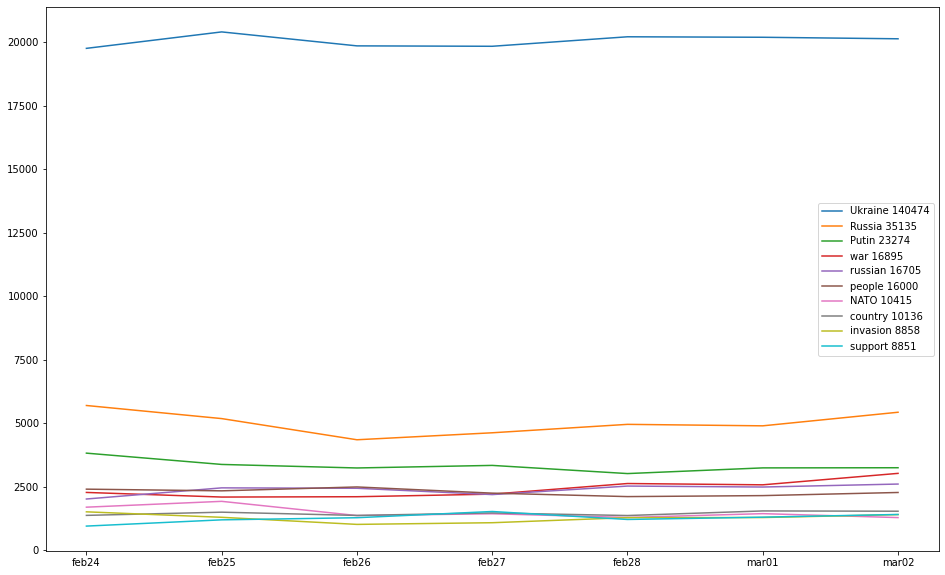

In [172]:
plot_over_time(all_word_counts, counts_list, 0, 10)

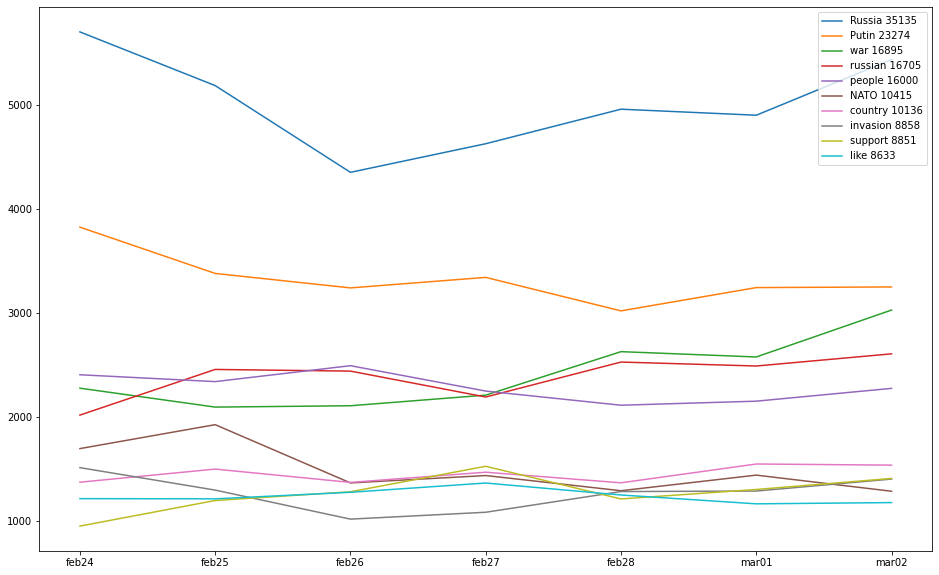

In [173]:
plot_over_time(all_word_counts, counts_list, 1, 11)

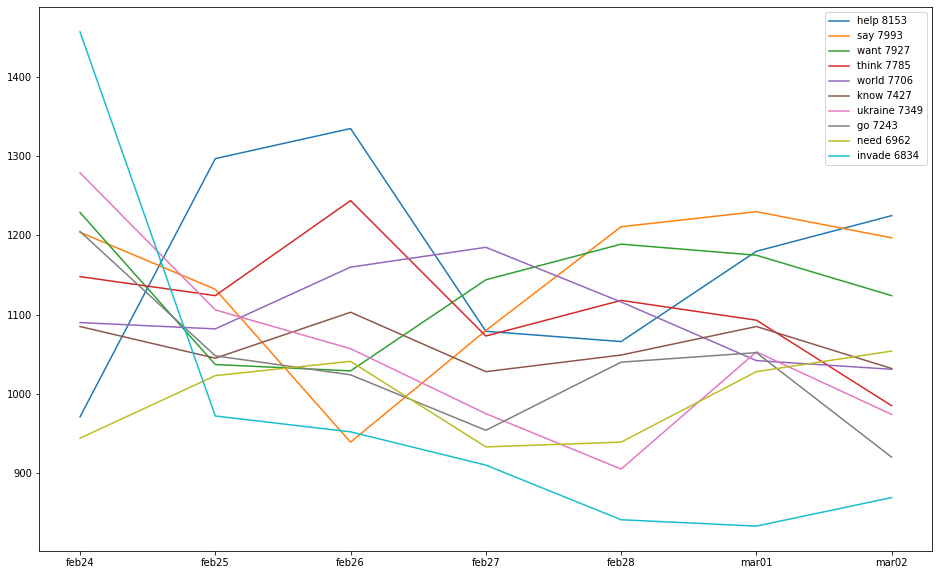

In [174]:
plot_over_time(all_word_counts, counts_list, 11, 21)

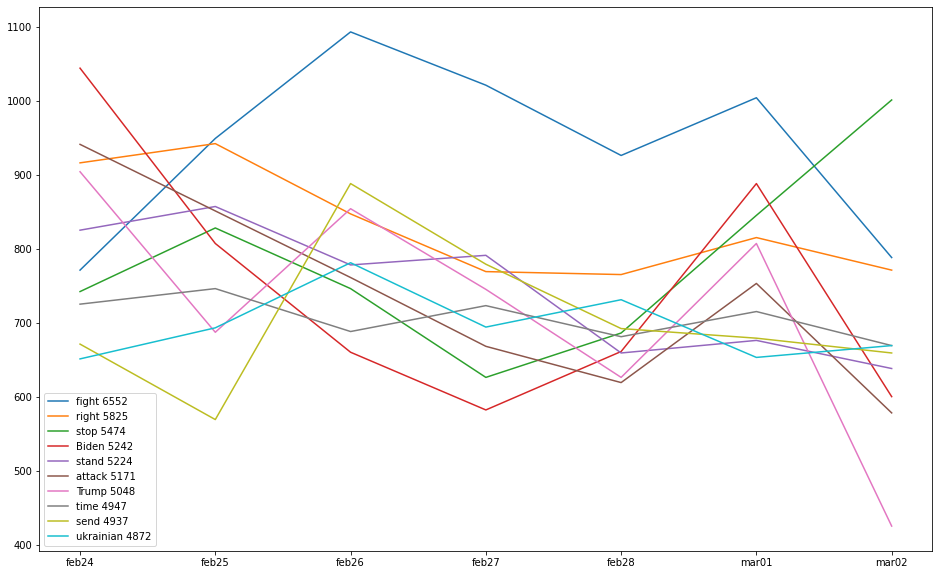

In [175]:
plot_over_time(all_word_counts, counts_list, 21, 31)

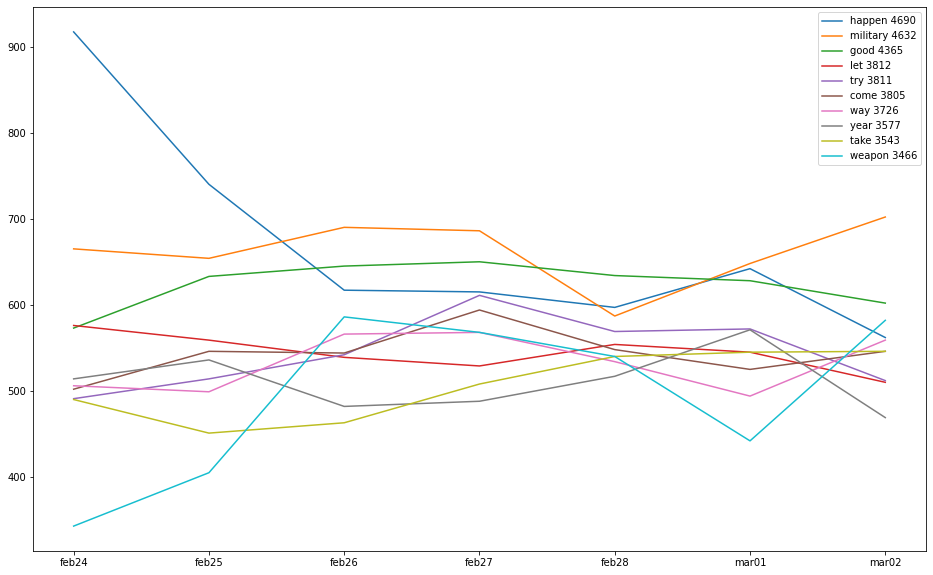

In [176]:
plot_over_time(all_word_counts, counts_list, 31, 41)

C:\Users\jakub\anaconda3\envs\WBII\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 128591 (\N{PERSON WITH FOLDED HANDS}) missing from current font.



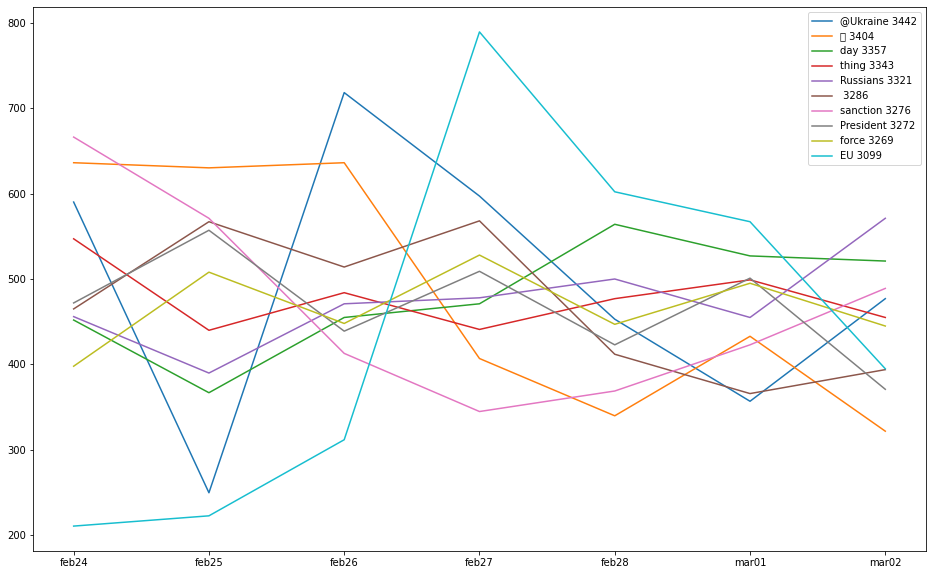

In [179]:
plot_over_time(all_word_counts, counts_list, 41, 51)

# teraz osobno

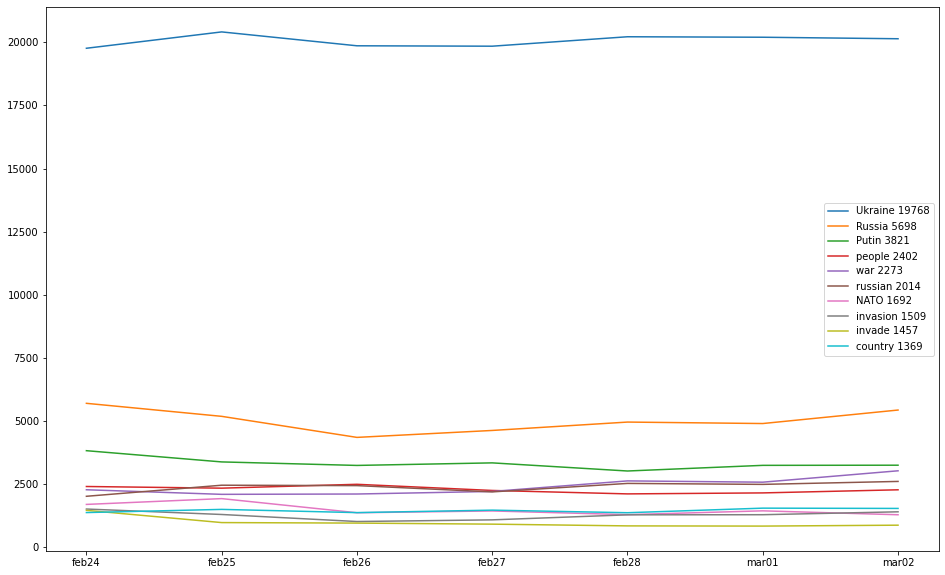

In [181]:
plot_over_time(feb24_word_counts, counts_list, 0, 10)

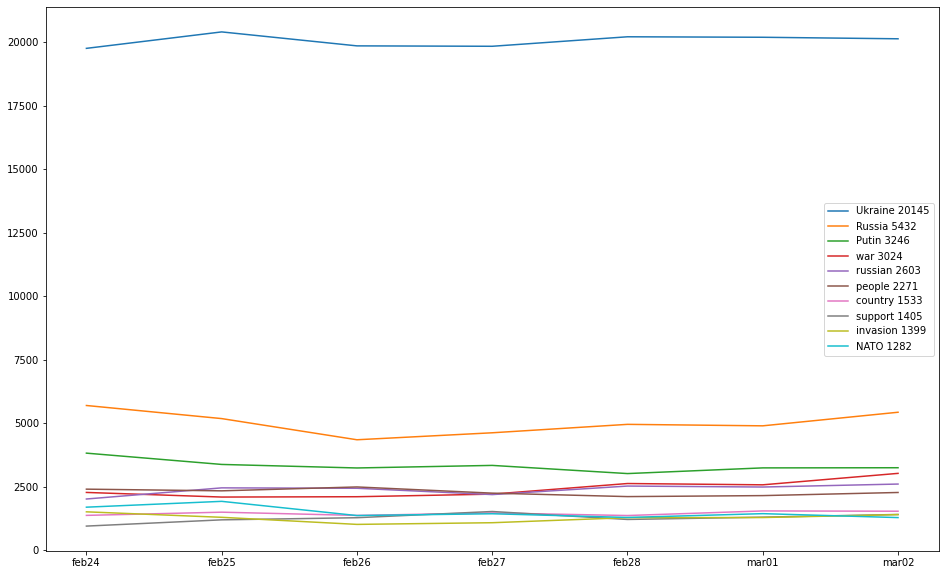

In [182]:
plot_over_time(mar02_word_counts, counts_list, 0, 10)

## teraz z pominiciem topki z all

In [203]:
def plot_without_all(base, counts_list, start, stop, all_counts = all_word_counts):
    figure(figsize=(16, 10))
    
    a = all_counts.most_common(50)
    for i,l in enumerate(a):#wybieramy tylko wyrazy
        a[i] = l[0].lower()
    
    b = base.most_common()
    nb = []

    for w in b:
        if w[0].lower() not in a:
            
            nb.append(w)
    
    
    for el in nb[start: stop]:
        y=[]
        for k in counts_list:
            y.append(k.get(el[0]))
        plt.plot(x, y, label = el[0] + " "+ str(el[1]))


    plt.legend()    
    plt.show()

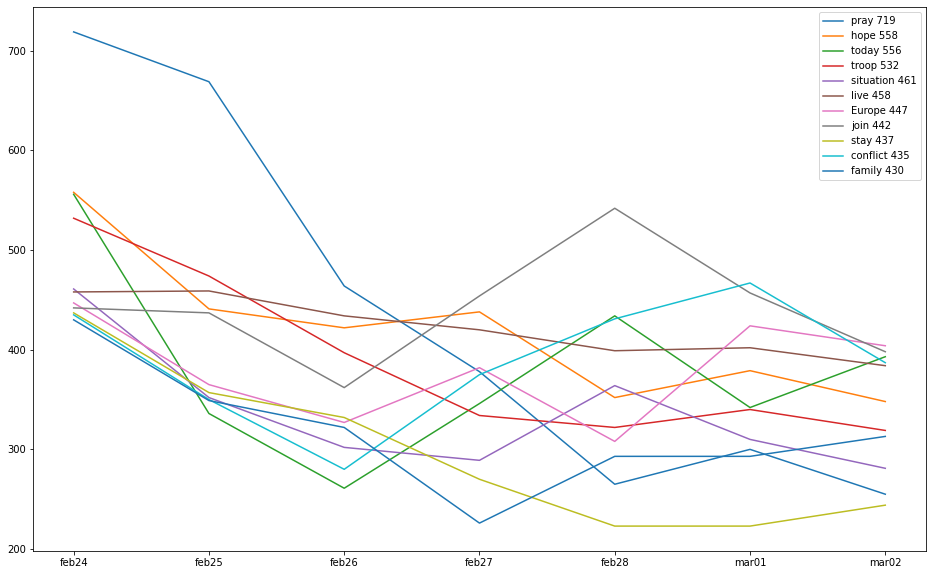

In [204]:
plot_without_all(feb24_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

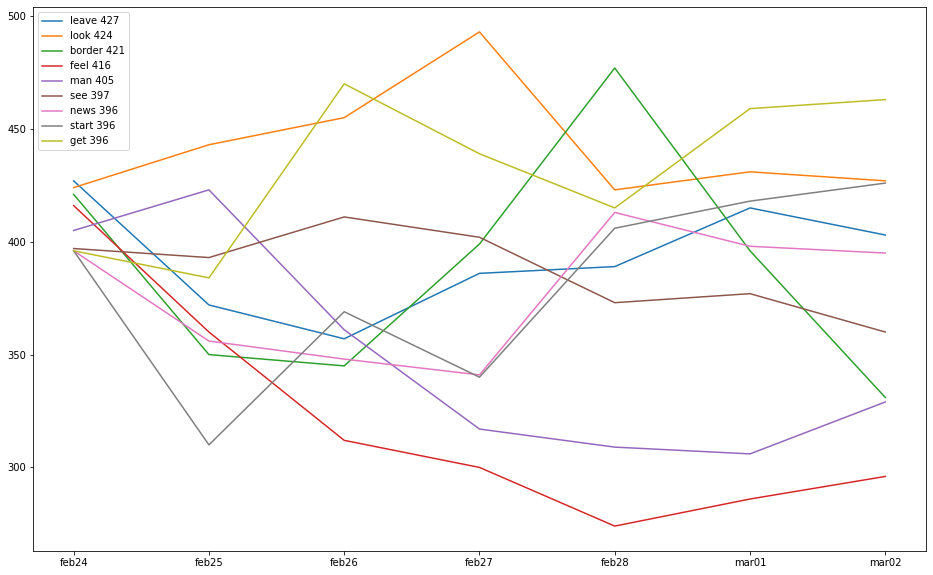

In [205]:
plot_without_all(feb24_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

## kolejne miesiace

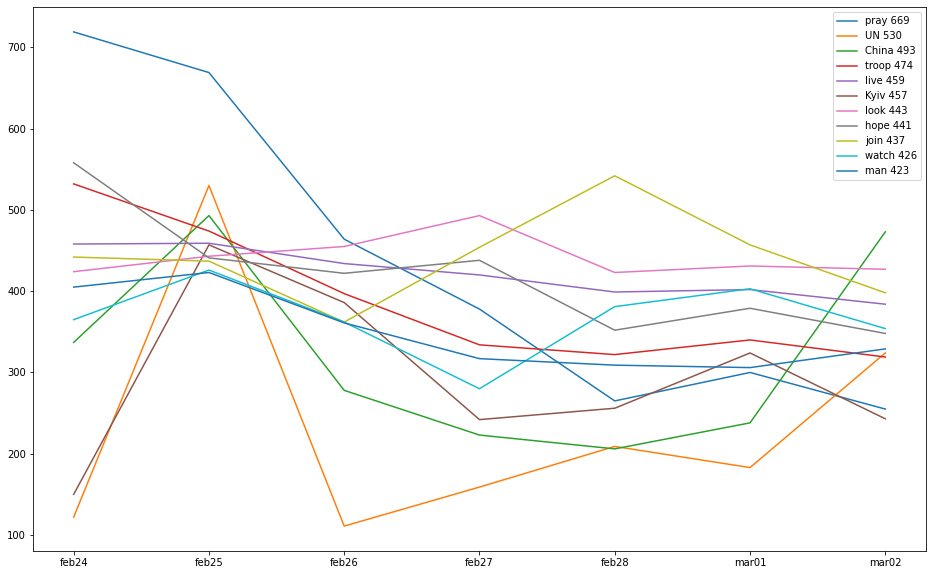

In [207]:
plot_without_all(feb25_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

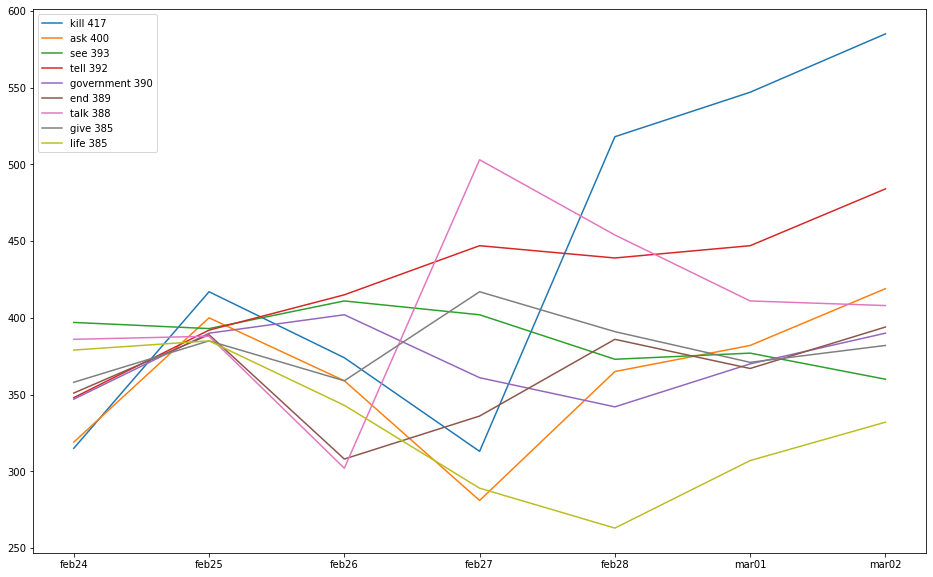

In [206]:
plot_without_all(feb25_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

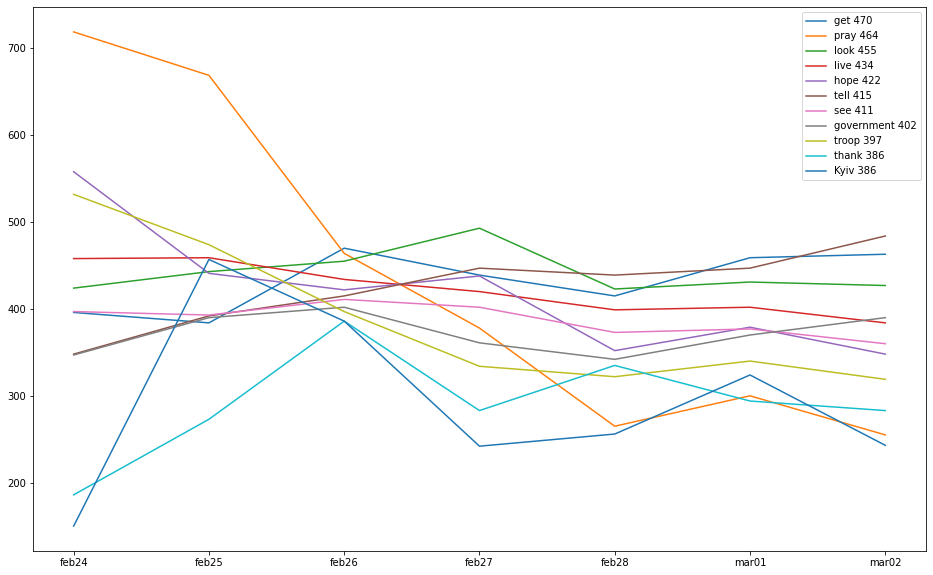

In [210]:
plot_without_all(feb26_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

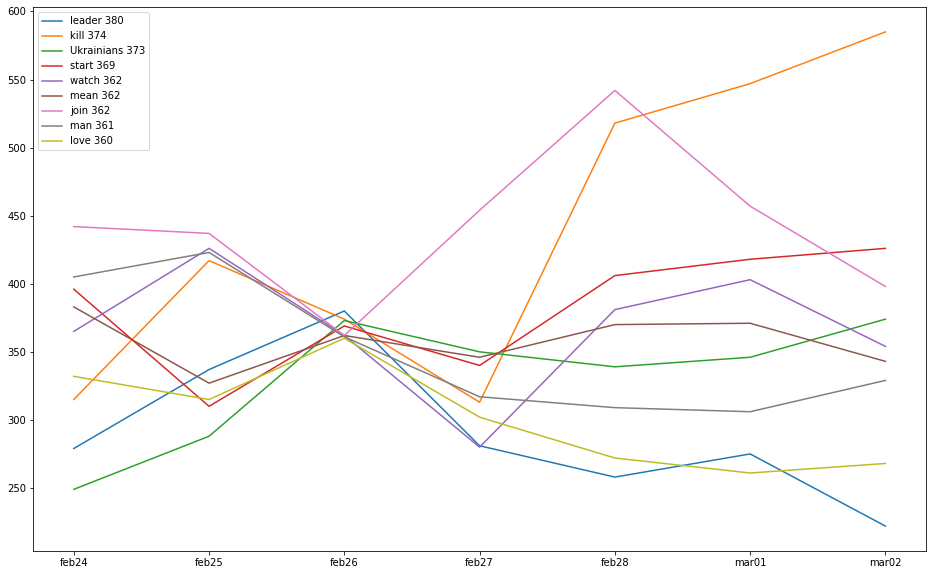

In [211]:
plot_without_all(feb26_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

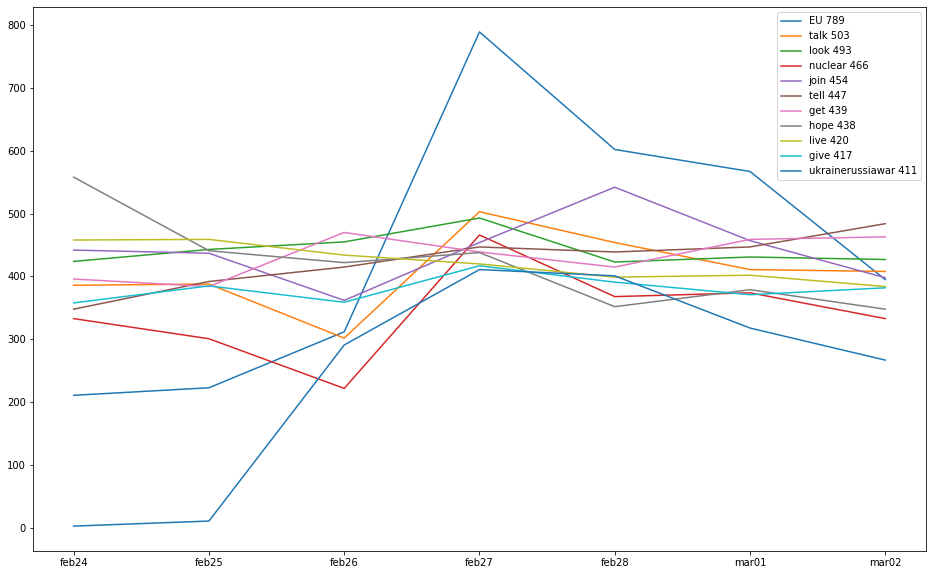

In [212]:
plot_without_all(feb27_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

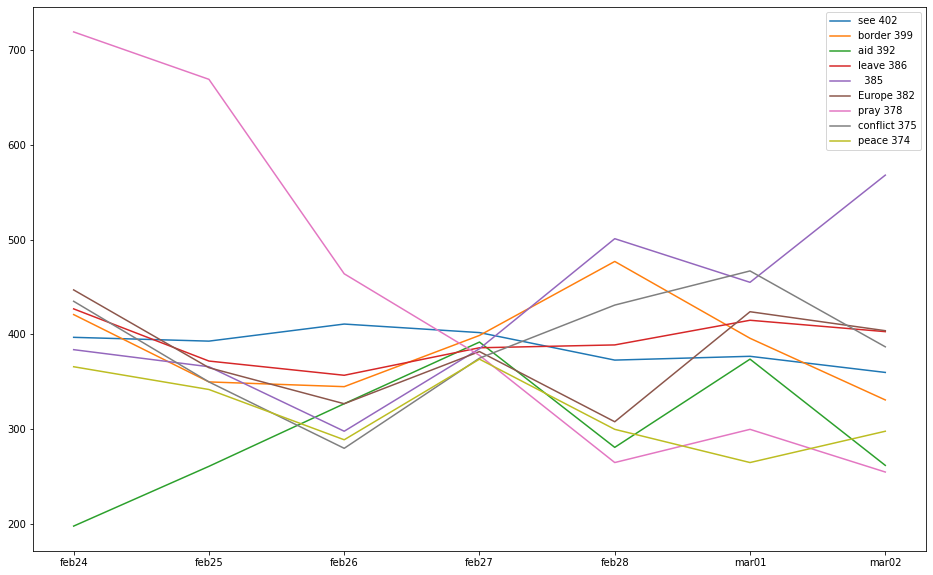

In [213]:
plot_without_all(feb27_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

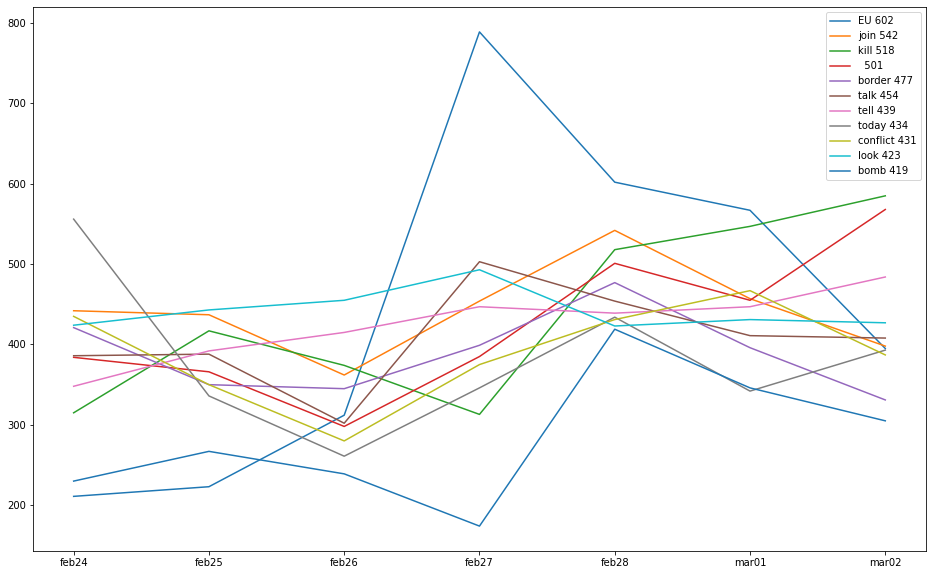

In [214]:
plot_without_all(feb28_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

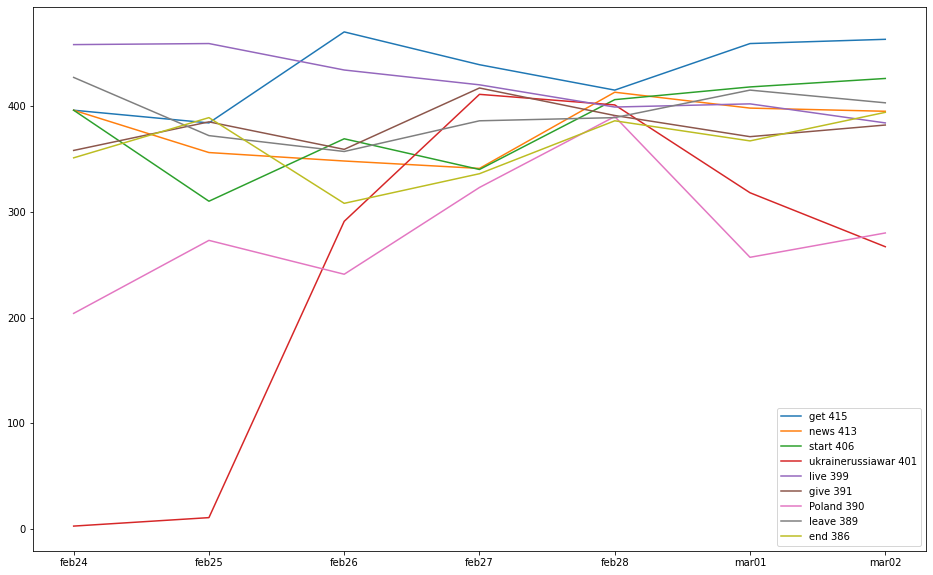

In [215]:
plot_without_all(feb28_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

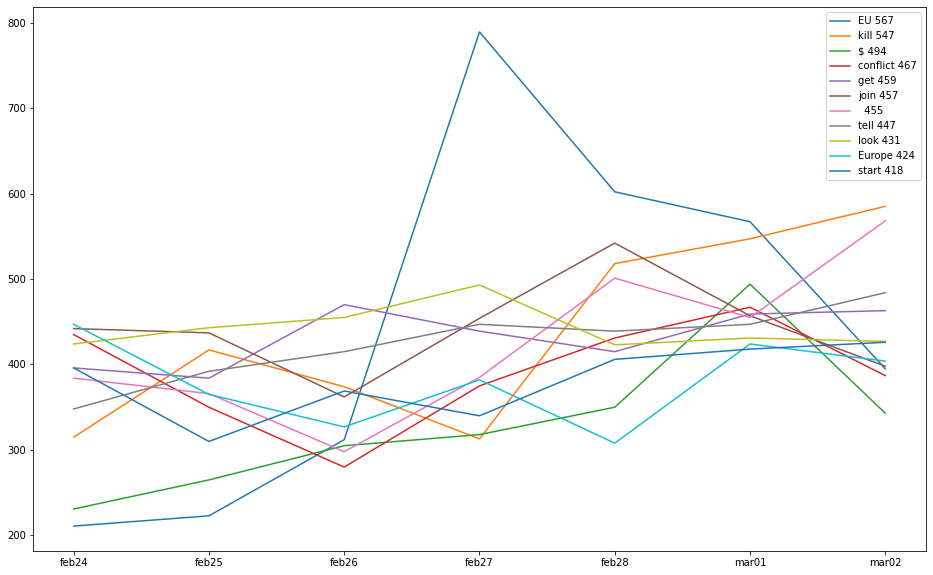

In [216]:
plot_without_all(mar01_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

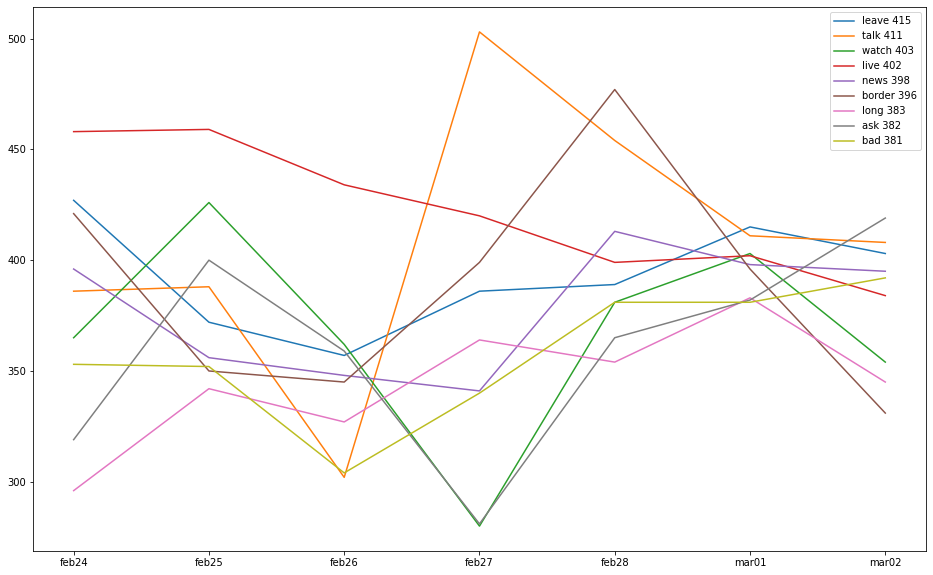

In [217]:
plot_without_all(mar01_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

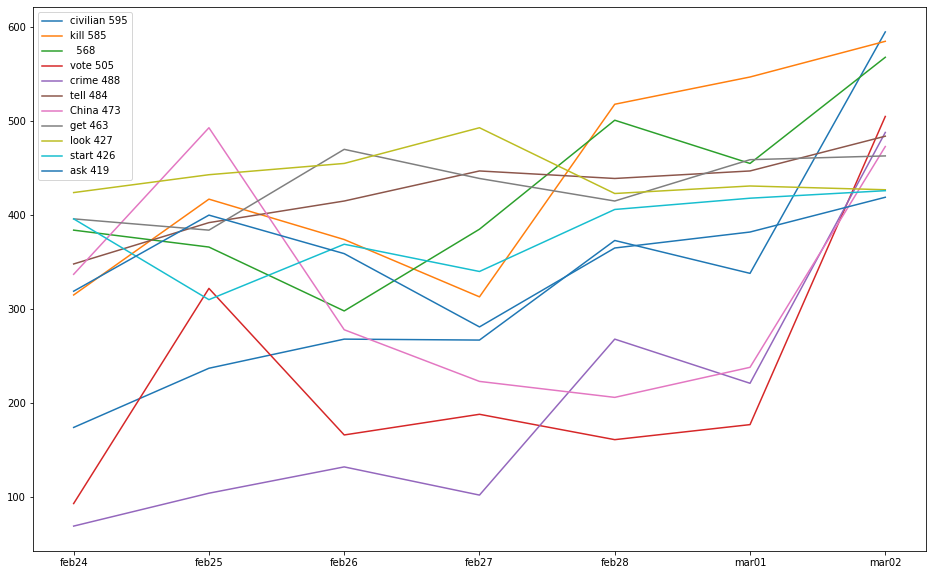

In [218]:
plot_without_all(mar02_word_counts, counts_list, 0, 11, all_counts = all_word_counts)

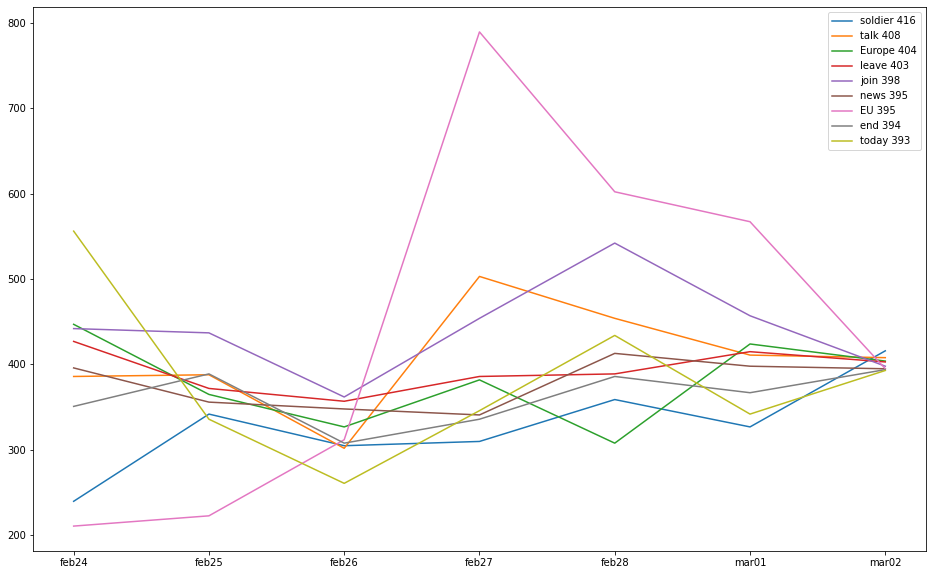

In [219]:
plot_without_all(mar02_word_counts, counts_list, 11, 20, all_counts = all_word_counts)

# moze cos ciekawszego wyjdzie z 2

In [224]:
mar02_word_counts_ngrams = Counter(mar02_word_counts_ngrams)
mar01_word_counts_ngrams = Counter(mar01_word_counts_ngrams)
feb28_word_counts_ngrams = Counter(feb28_word_counts_ngrams)
feb27_word_counts_ngrams = Counter(feb27_word_counts_ngrams)
feb26_word_counts_ngrams = Counter(feb26_word_counts_ngrams)
feb25_word_counts_ngrams = Counter(feb25_word_counts_ngrams)
feb24_word_counts_ngrams = Counter(feb24_word_counts_ngrams)


In [225]:
all_word_counts_ngrams = mar02_word_counts_ngrams + mar01_word_counts_ngrams + feb28_word_counts_ngrams + feb27_word_counts_ngrams + feb26_word_counts_ngrams + feb25_word_counts_ngrams + feb24_word_counts_ngrams

In [226]:
x = ['feb24', 'feb25', 'feb26', 'feb27', 'feb28', 'mar01', 'mar02']
ngrams_list = [mar02_word_counts_ngrams , mar01_word_counts_ngrams , feb28_word_counts_ngrams , feb27_word_counts_ngrams , feb26_word_counts_ngrams , feb25_word_counts_ngrams, feb24_word_counts_ngrams]


In [227]:
def plot_over_time(base, counts_list, start, stop):
    figure(figsize=(16, 10))

    for el in base.most_common()[start: stop]:
        y=[]
        for k in counts_list:
            y.append(k.get(el[0]))
        plt.plot(x, y, label = el[0] + " "+ str(el[1]))


    plt.legend()    
    plt.show()

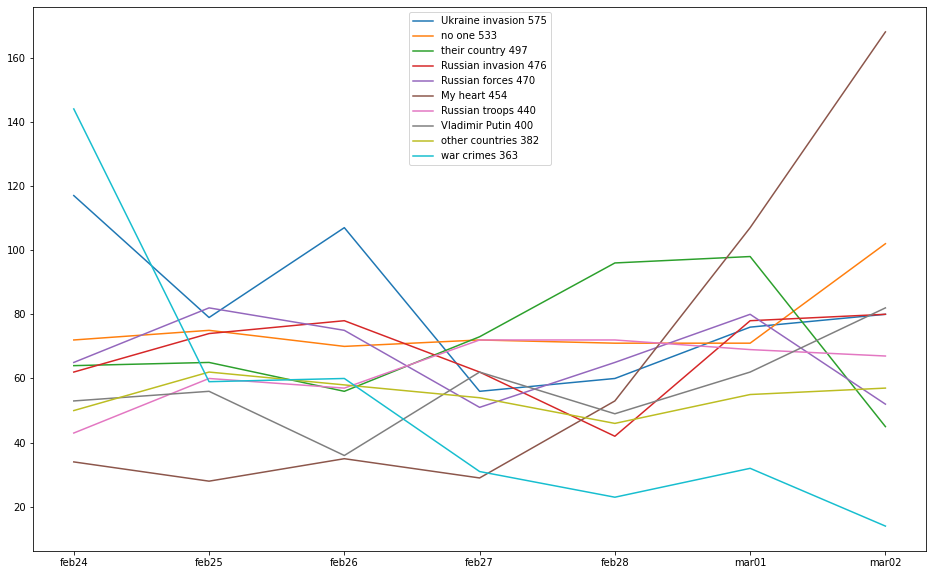

In [228]:
plot_over_time(all_word_counts_ngrams, ngrams_list, 0, 10)

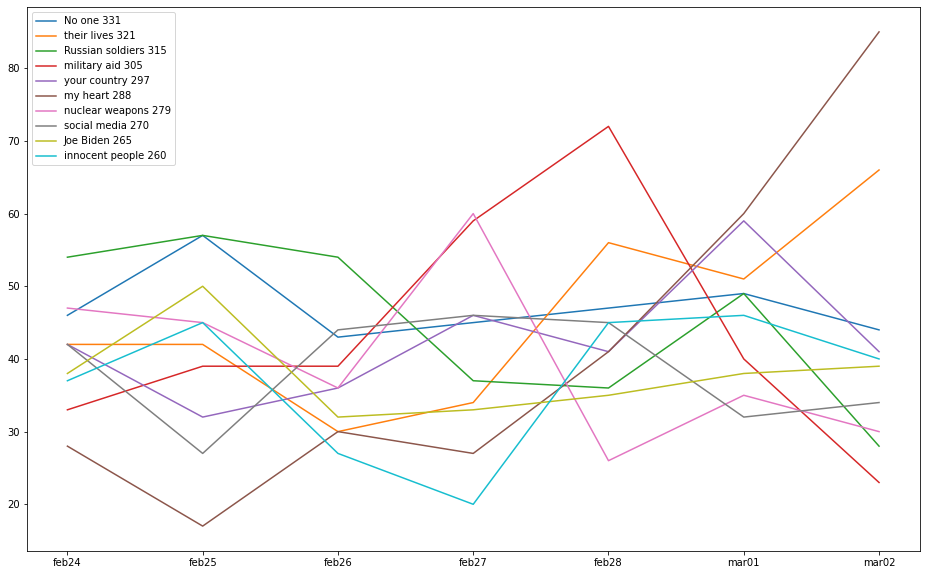

In [229]:
plot_over_time(all_word_counts_ngrams, ngrams_list, 10, 20)

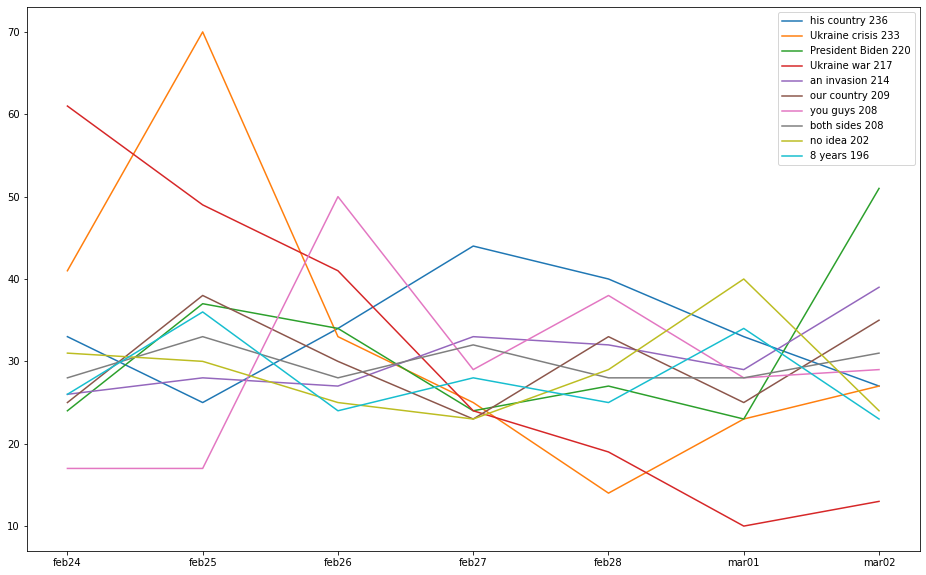

In [230]:
plot_over_time(all_word_counts_ngrams, ngrams_list, 20, 30)

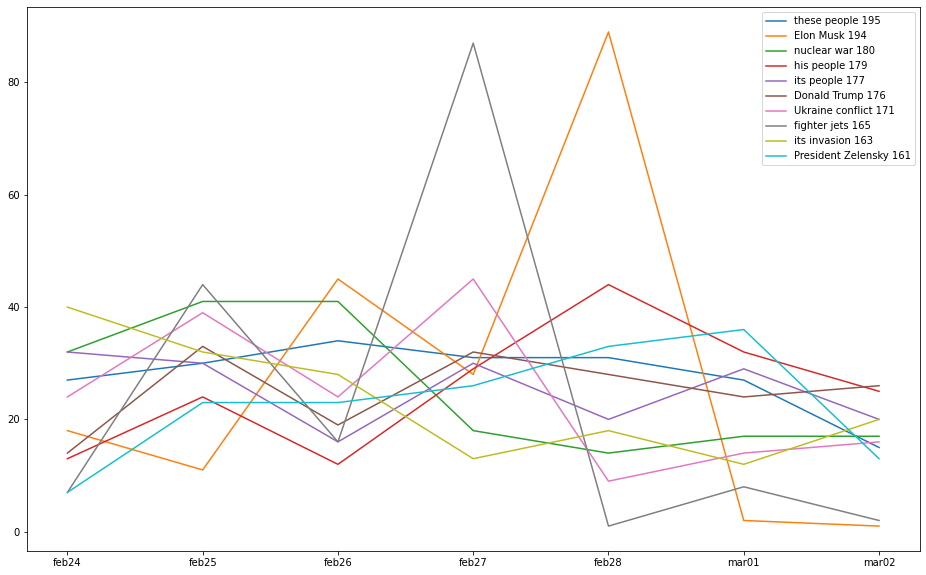

In [231]:
plot_over_time(all_word_counts_ngrams, ngrams_list, 30, 40)

27 lutego wiadomość o starlinkach dla Ukrainy

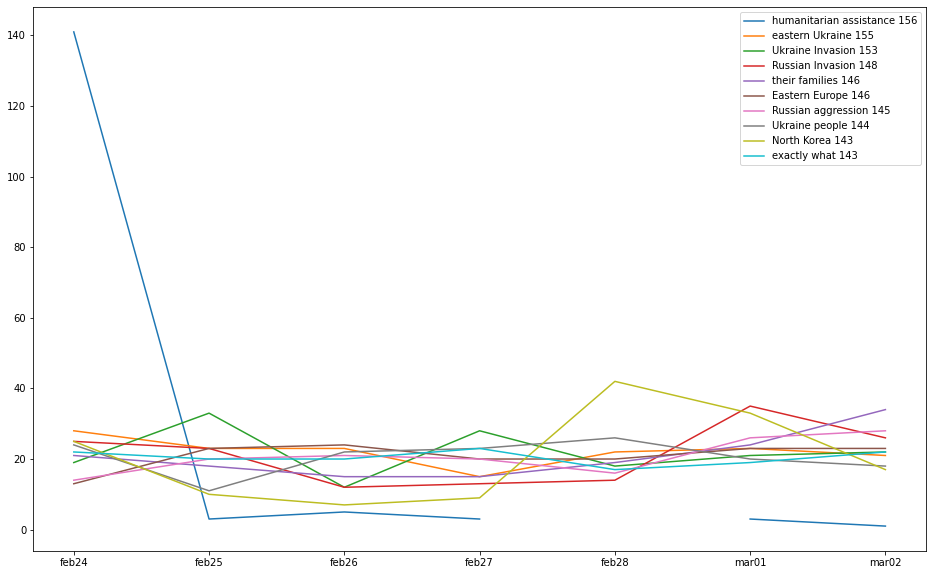

In [232]:
plot_over_time(all_word_counts_ngrams, ngrams_list, 40, 50)

## teraz dniami ale juz bez tych fraz co wyzej

In [239]:
def plot_without_all_ngrams(base, counts_list, start, stop, all_counts = all_word_counts_ngrams):
    figure(figsize=(16, 10))
    
    a = all_counts.most_common(50)
    for i,l in enumerate(a):#wybieramy tylko wyrazy
        a[i] = l[0].lower()
    
    b = base.most_common()
    nb = []

    for w in b:
        if w[0].lower() not in a:
            
            nb.append(w)
    
    
    for el in nb[start: stop]:
        y=[]
        for k in counts_list:
            y.append(k.get(el[0]))
        plt.plot(x, y, label = el[0] + " "+ str(el[1]))


    plt.legend()    
    plt.show()

C:\Users\jakub\anaconda3\envs\WBII\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 128591 (\N{PERSON WITH FOLDED HANDS}) missing from current font.



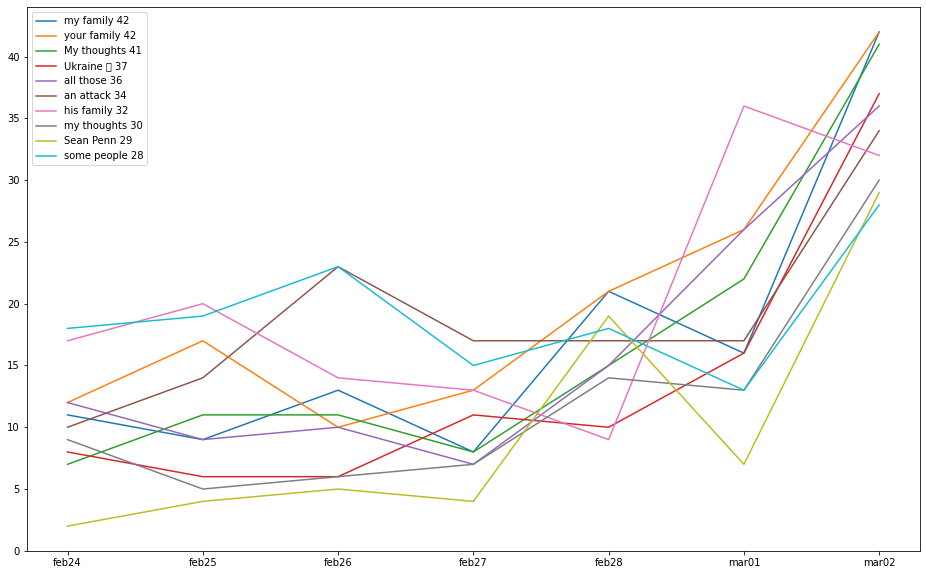

In [240]:
plot_without_all_ngrams(feb24_word_counts_ngrams, ngrams_list, 0, 10)

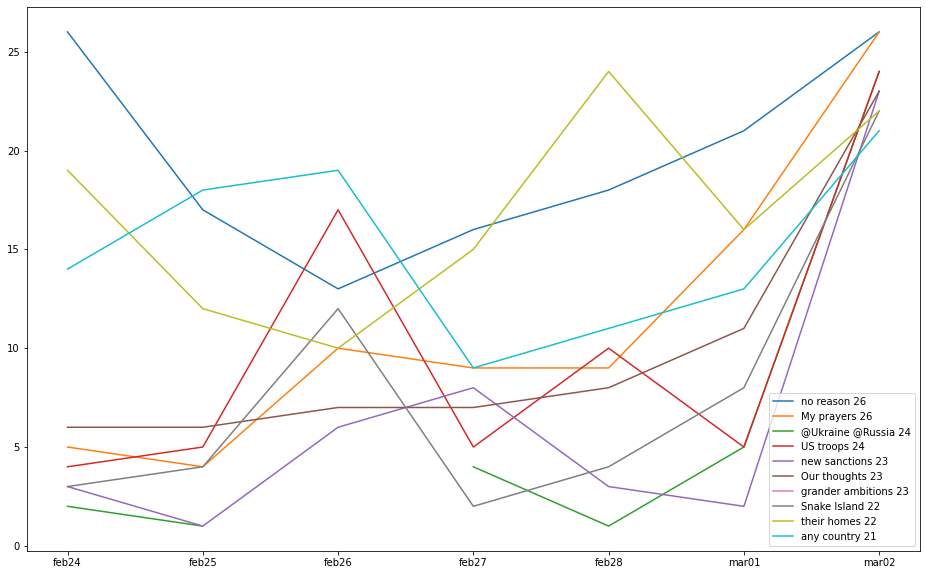

In [241]:
plot_without_all_ngrams(feb24_word_counts_ngrams, ngrams_list, 10, 20)

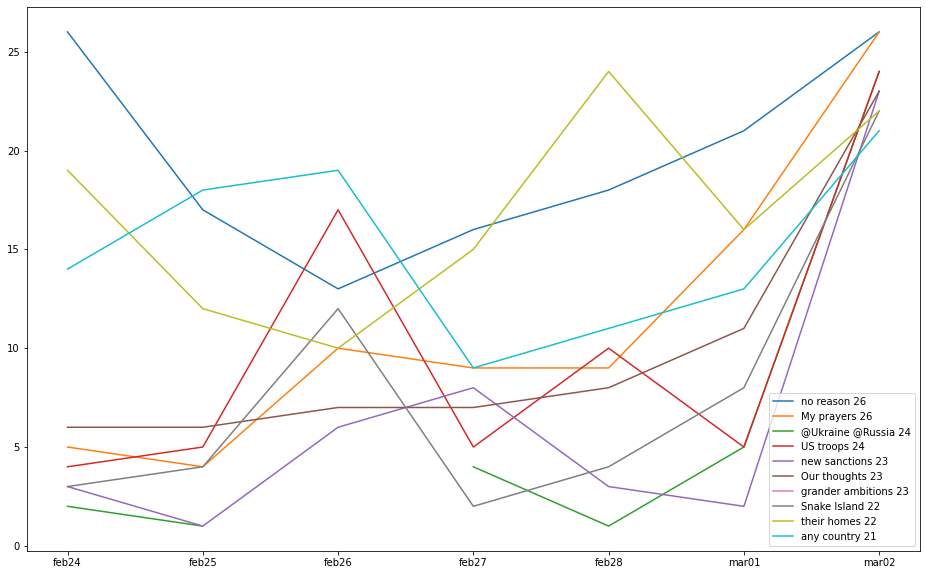

In [242]:
plot_without_all_ngrams(feb24_word_counts_ngrams, ngrams_list, 10, 20)

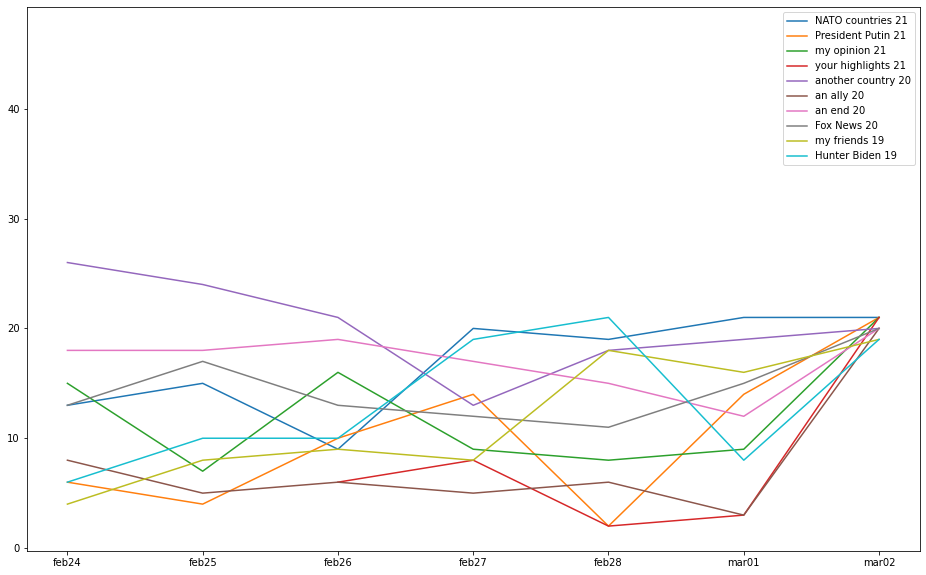

In [243]:
plot_without_all_ngrams(feb24_word_counts_ngrams, ngrams_list, 20, 30)

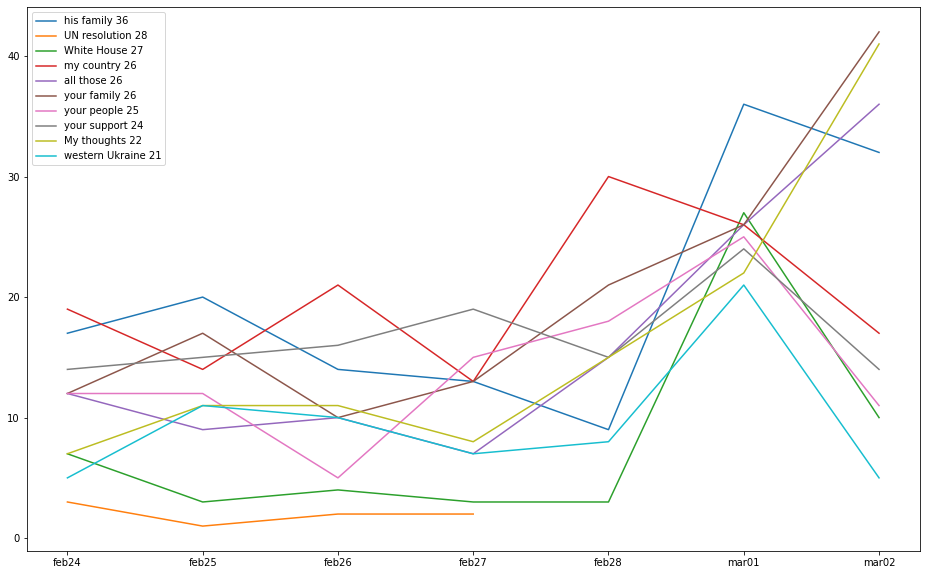

In [244]:
plot_without_all_ngrams(feb25_word_counts_ngrams, ngrams_list, 0 ,10)

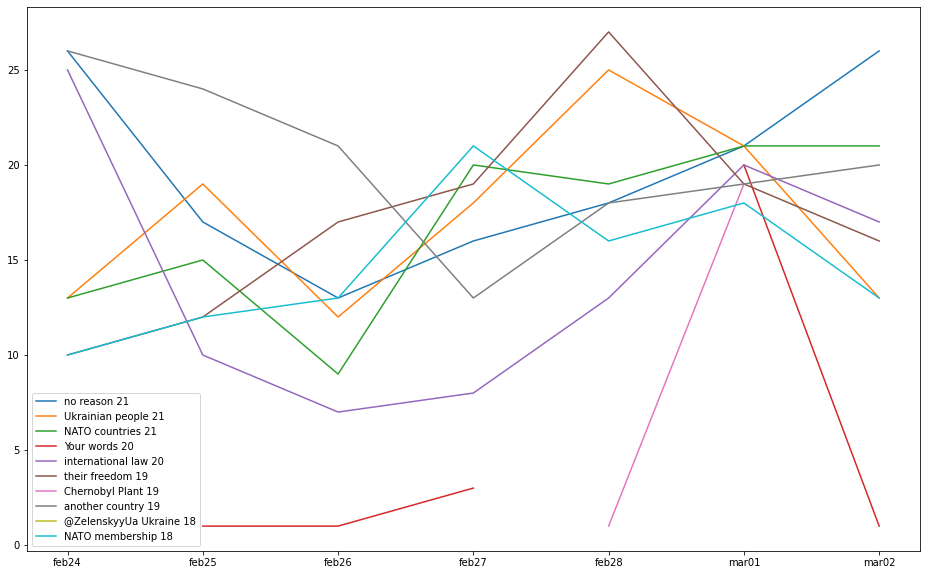

In [245]:
plot_without_all_ngrams(feb25_word_counts_ngrams, ngrams_list, 10, 20)

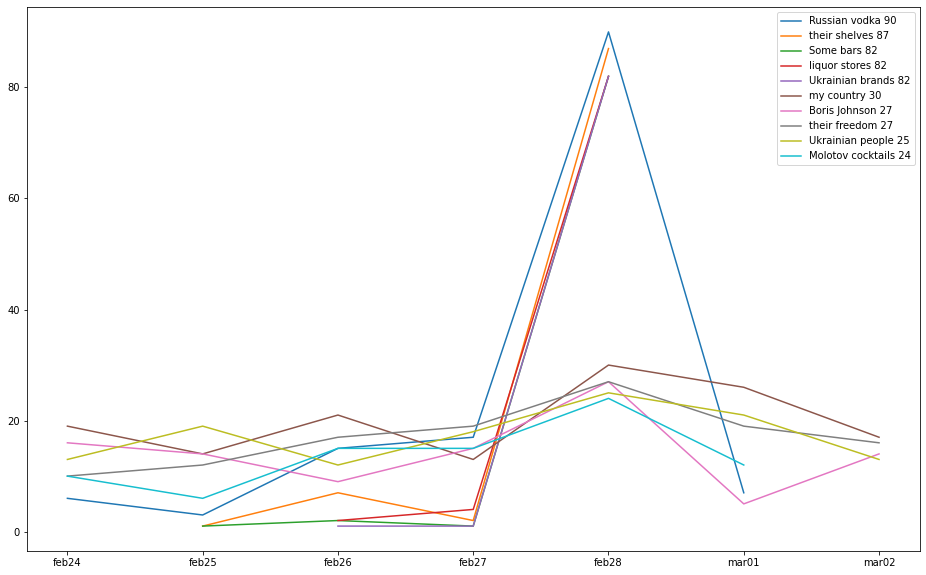

In [246]:
plot_without_all_ngrams(feb26_word_counts_ngrams, ngrams_list, 0 ,10)

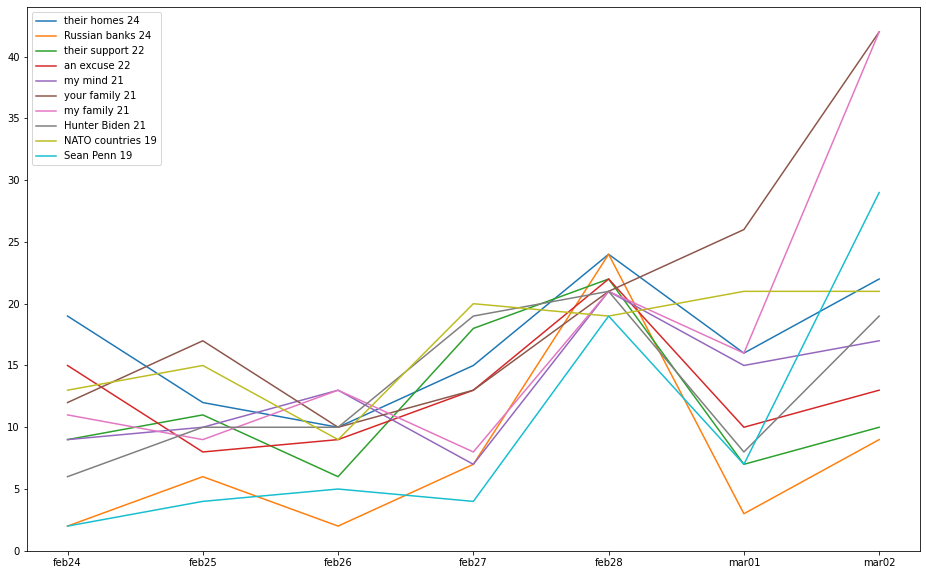

In [247]:
plot_without_all_ngrams(feb26_word_counts_ngrams, ngrams_list, 10, 20)

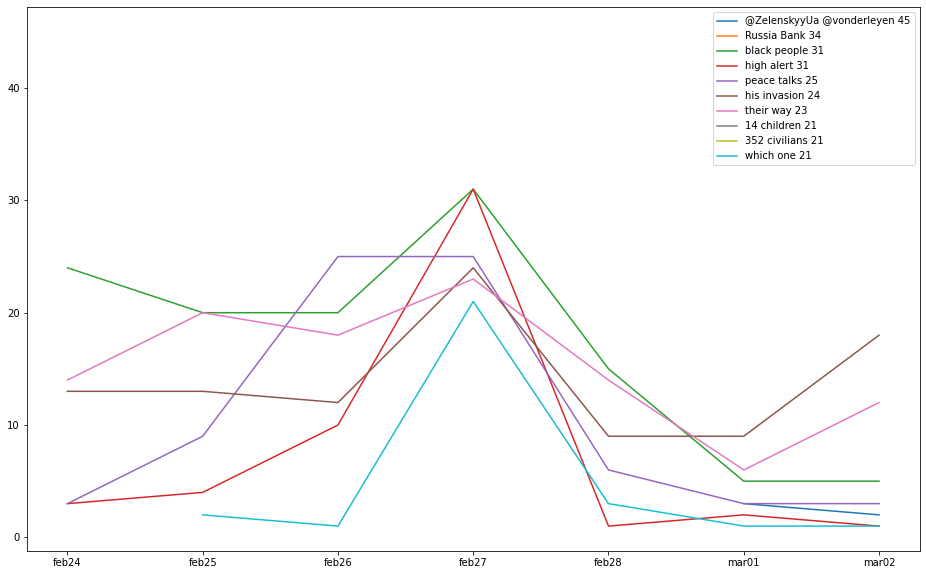

In [250]:
plot_without_all_ngrams(feb27_word_counts_ngrams, ngrams_list, 0 ,10)

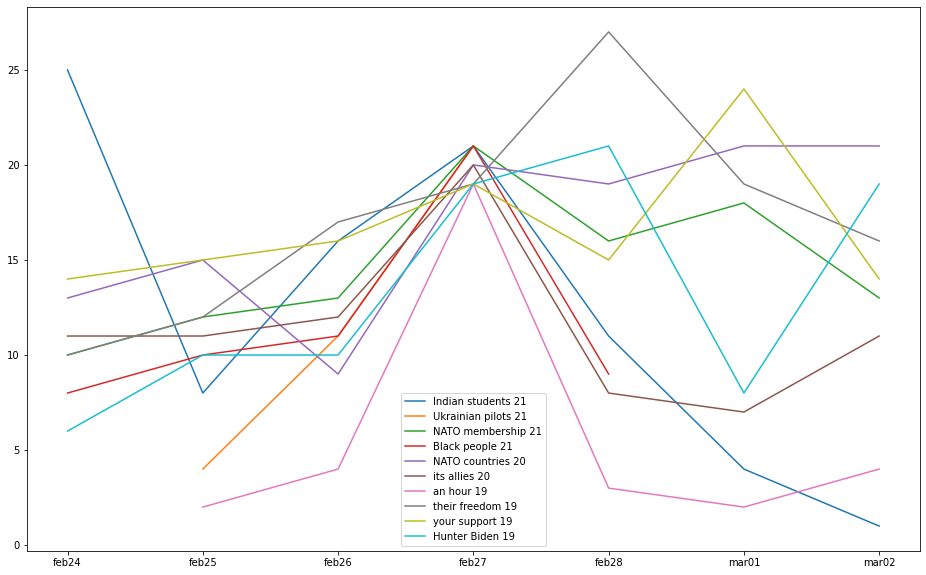

In [251]:
plot_without_all_ngrams(feb27_word_counts_ngrams, ngrams_list, 10, 20)

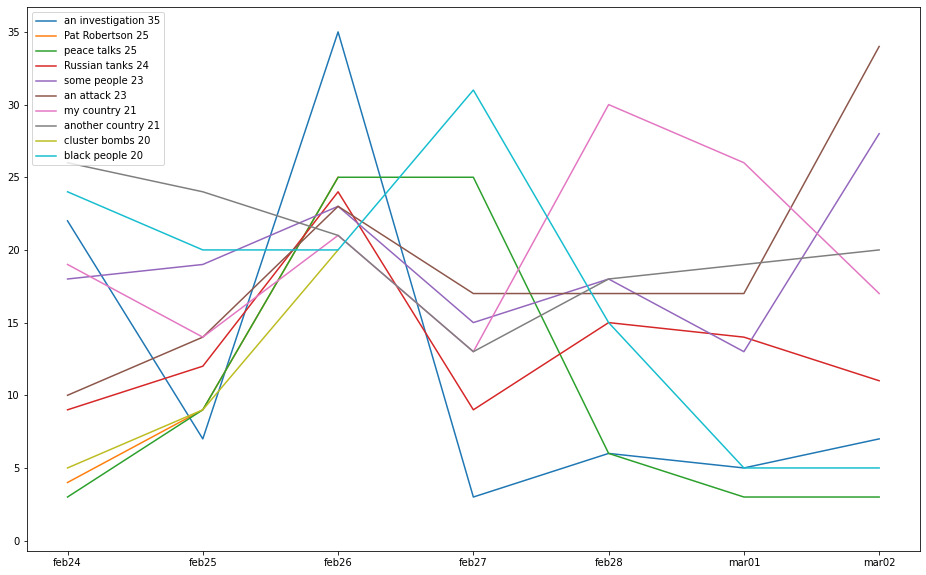

In [252]:
plot_without_all_ngrams(feb28_word_counts_ngrams, ngrams_list, 0 ,10)

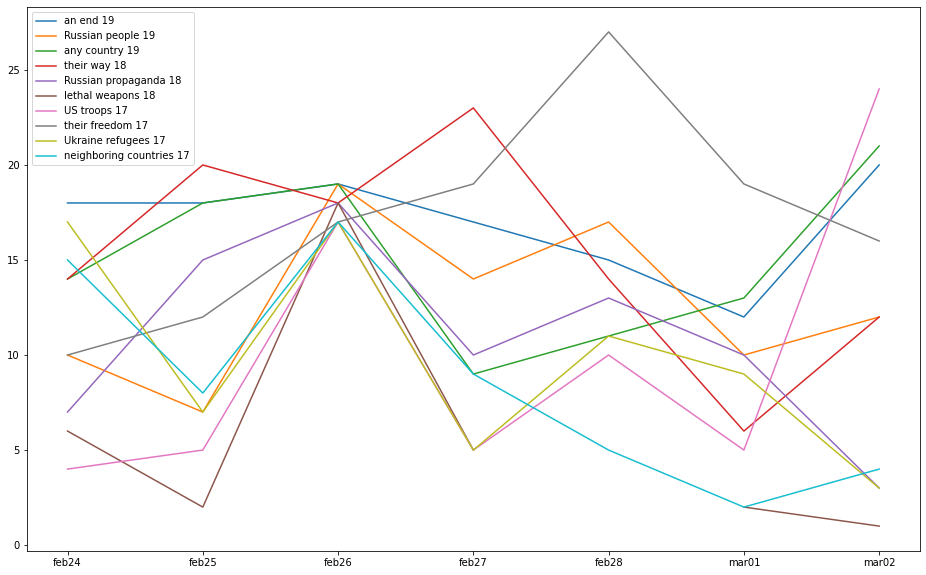

In [253]:
plot_without_all_ngrams(feb28_word_counts_ngrams, ngrams_list, 10, 20)

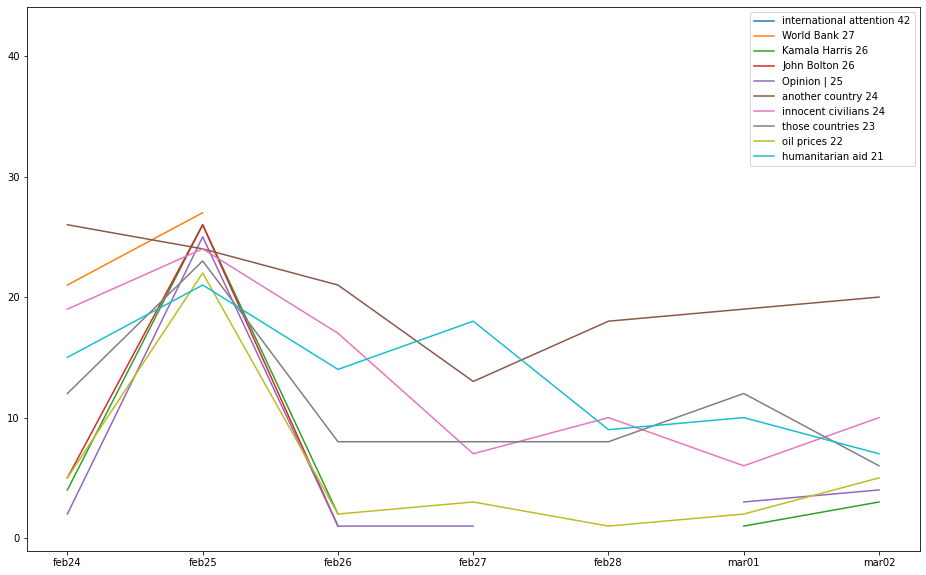

In [254]:
plot_without_all_ngrams(mar01_word_counts_ngrams, ngrams_list, 0 ,10)

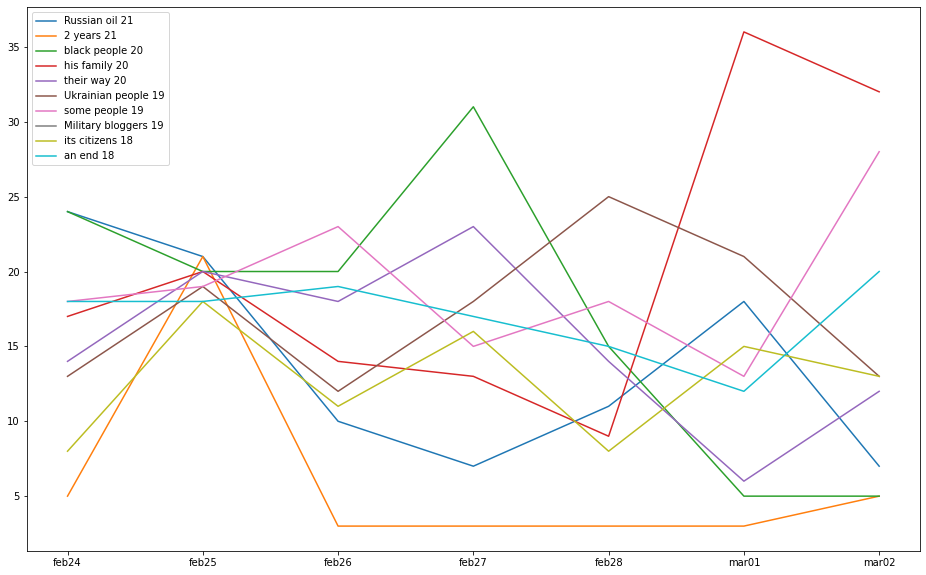

In [255]:
plot_without_all_ngrams(mar01_word_counts_ngrams, ngrams_list, 10, 20)

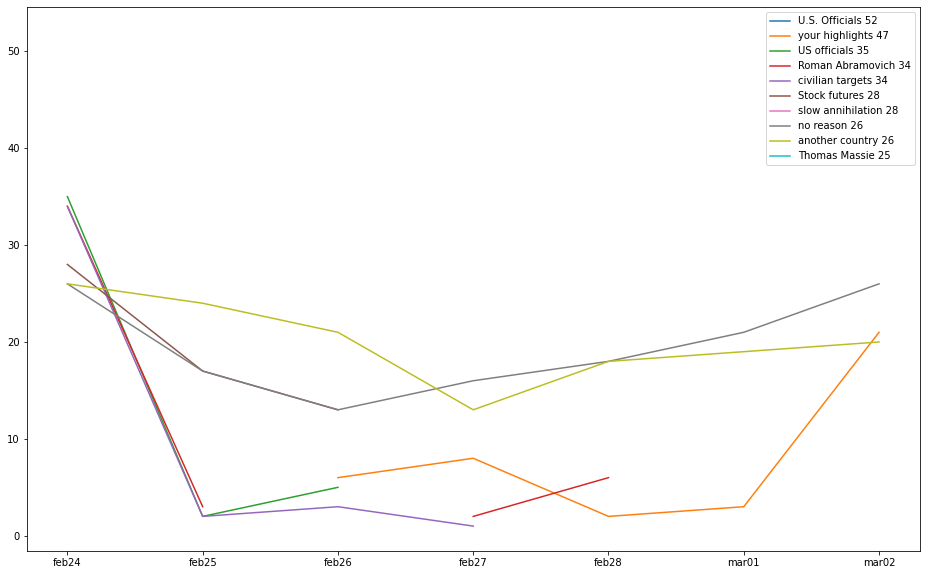

In [256]:
plot_without_all_ngrams(mar02_word_counts_ngrams, ngrams_list, 0 ,10)

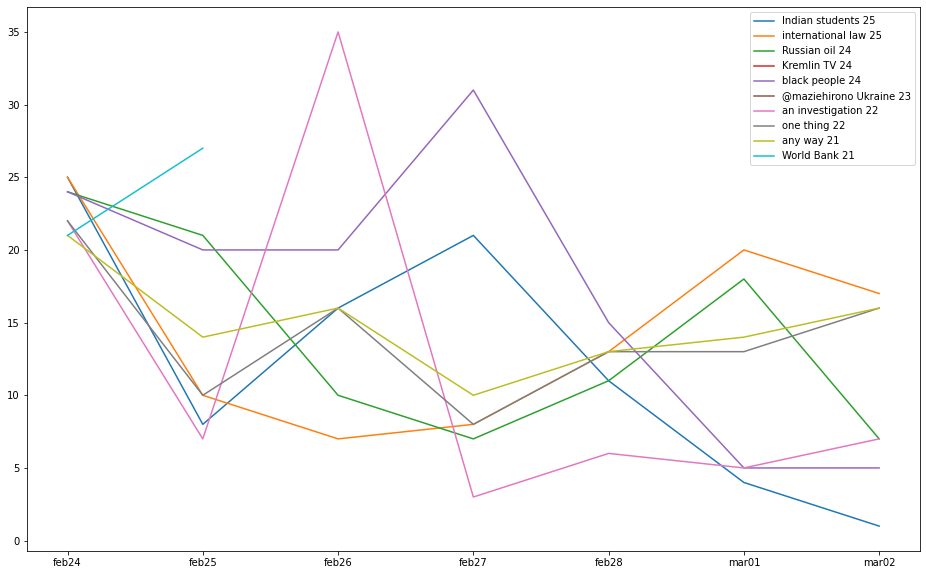

In [257]:
plot_without_all_ngrams(mar02_word_counts_ngrams, ngrams_list, 10, 20)

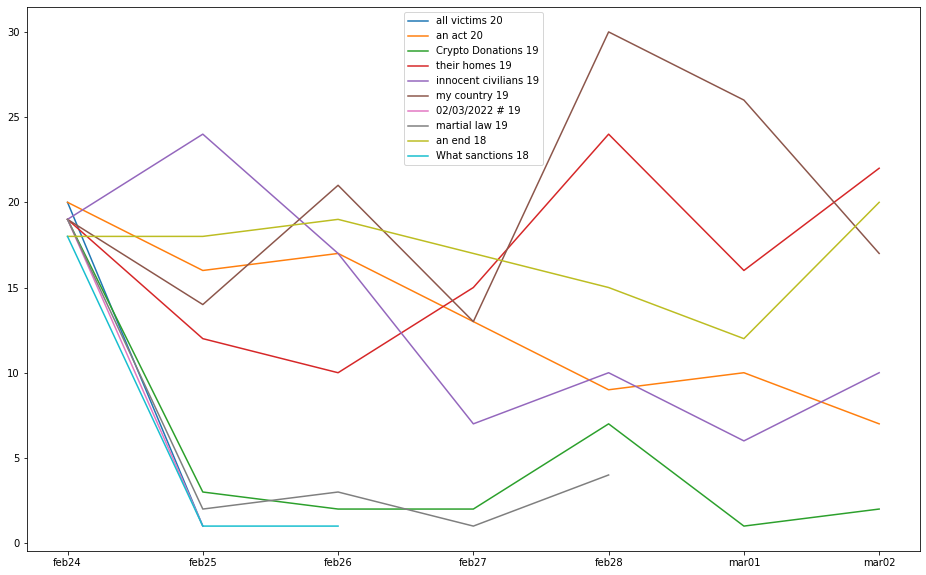

In [260]:
plot_without_all_ngrams(mar02_word_counts_ngrams, ngrams_list, 20, 30)

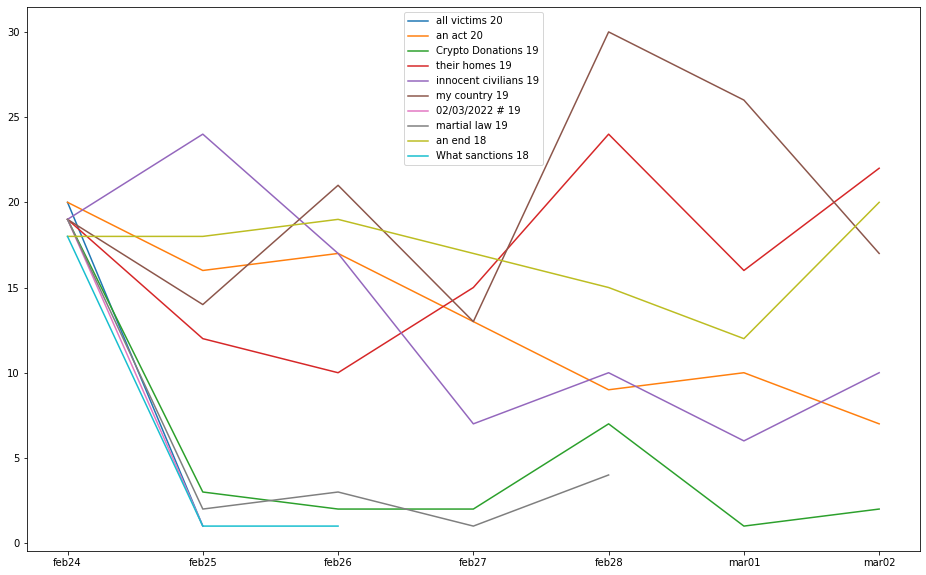

In [261]:
plot_without_all_ngrams(mar02_word_counts_ngrams, ngrams_list, 20, 30)

In [36]:
df = df.loc[df['Language'] == 'en']

In [37]:
48001*7-len(df)

428

In [38]:
df = df.drop(columns=['Unnamed: 0', 'Language'])
df = df.reset_index()

In [39]:
df["Text_en"] = df['Text'].swifter.apply(en)

Pandas Apply:   0%|          | 0/335579 [00:00<?, ?it/s]

In [40]:
df_copy = df

# EDA

In [ ]:
def cloud_from_lemmas(word_counts):
    wc = WordCloud(width=800, height=400)
    wc.generate_from_frequencies(frequencies=word_counts)
    plt.figure(figsize=(10,8))
    plt.imshow(wc)

def plot_counts(counts):
    fig = px.bar(counts,orientation='h', y='word', x='count')

    fig['layout']['yaxis']['autorange'] = "reversed"
    fig.update_layout(bargap=0.30, font={'size':10})
    return fig

In [41]:
not_interesting = set(["\n", "\n\n", "🇺", "🇦", " ", "", '🇷', '👇', 'amp'])
df['lemmas'] = df.Text_en.apply(lambda doc: [token.lemma_ for token in doc if not token.is_stop if not token.is_punct if not token.lemma_ in not_interesting])

In [43]:
doc_lens = df["Text_en"].str.len()

doc_lens.hist(log_y=True)

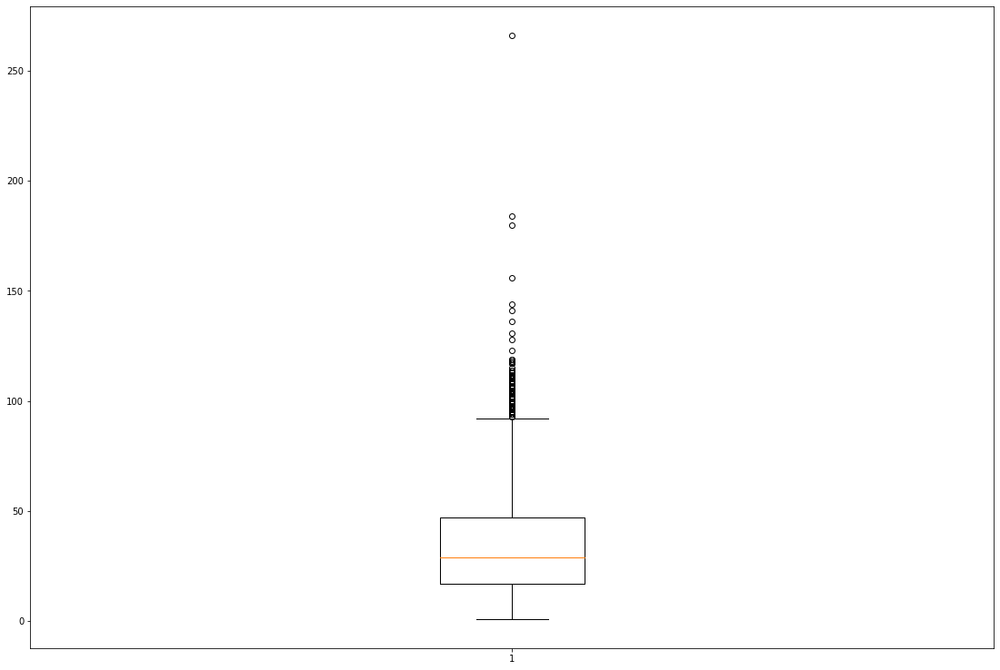

In [44]:
fig, ax = plt.subplots(figsize=(19, 13))
ax.boxplot(doc_lens)
plt.show()

In [ ]:
word_counts = Counter(df.lemmas.sum())

In [ ]:
counts = pd.DataFrame(Counter({k: v for k, v in word_counts.items()}).most_common(60), columns=['word', 'count'])